In [1]:
%pylab nbagg
from tvb.simulator.lab import *

Populating the interactive namespace from numpy and matplotlib
   INFO  log level set to INFO


In [2]:
epileptic = [9,47]
almost_epileptic = [2,40]
stimulus_target = [9,47,2,40]
stimulus_amplitude = 20
stimulus_weight = 2 #0-2 for each region
onset = 0
period = 500
pulse_width = 0
sim_time = 5000

sim = set_sim(epileptic, almost_epileptic, stimulus_target, stimulus_amplitude, 
              stimulus_weight, onset, period, pulse_width, sim_time)

NameError: name 'set_sim' is not defined

In [11]:
(tt, ta), (teeg, eeg), (st, se) = sim.run() 

In [3]:
normalize_plot_tavg(tt, ta, [0,1,38,39, 9,47,2,40], "testing", epileptic, almost_epileptic, 
                    stimulus_target, stimulus_amplitude, stimulus_weight,
                    onset, period, pulse_width)

NameError: name 'tt' is not defined

<IPython.core.display.Javascript object>


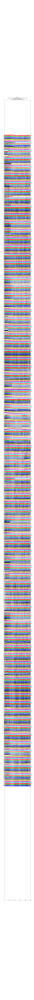

In [18]:
normalize_plot_ieeg(st, se, np.r_[:570], "testing", epileptic, almost_epileptic, 
                    stimulus_target, stimulus_amplitude, stimulus_weight,
                    onset, period, pulse_width)

C:\Users\Ali\Documents\ISML\TVB_Distribution\tvb_data\Lib\site-packages\IPython\kernel\__main__.py:5: RuntimeWarning: invalid value encountered in divide


<IPython.core.display.Javascript object>


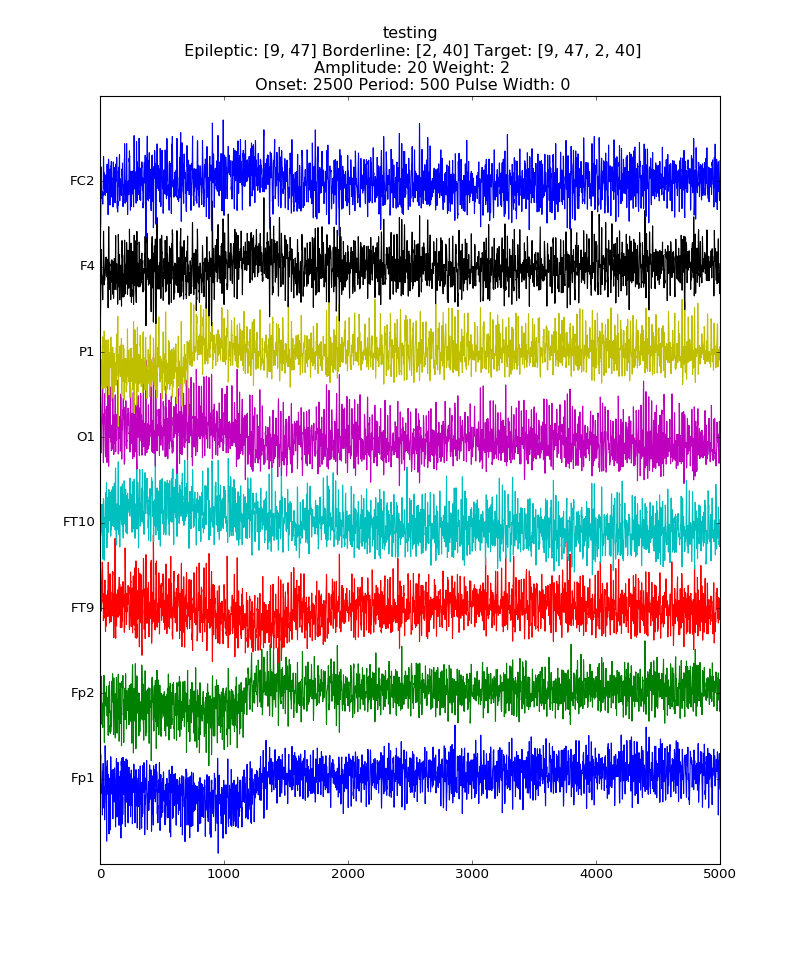

In [19]:
normalize_plot_eeg(teeg, eeg, [0,1,38,39, 9,47,2,40], "testing", epileptic, almost_epileptic, 
                    stimulus_target, stimulus_amplitude, stimulus_weight,
                    onset, period, pulse_width)

In [9]:
def set_sim(epileptic, almost_epileptic, target, amp, stim_weight, 
            onset, period, pw, sim_time):
    
    #Set up epileptic regions
    epileptors = models.Epileptor(Ks=-0.2, Kf=0.1, r=0.00015)
    epileptors.x0 = np.ones((76))*-2.4 #set all brain regions non-epileptic
    epileptors.x0[almost_epileptic] = np.ones((2))*-1.9 #overwrite as epileptogenic; borderline epileptic ('close to epilepsy threshold')
    epileptors.x0[epileptic] = np.ones((3))*-1.6 #rHC and lHC are epileptic

    #brain parameters and integration method
    con = connectivity.Connectivity(load_default=True)
    coupl = coupling.Difference(a=1.)
   


    hiss = noise.Additive(nsig = numpy.array([0., 0., 0., 0.0003, 0.0003, 0.]))
    heunint = integrators.HeunStochastic(dt=0.05, noise=hiss)
    #heunint = integrators.HeunDeterministic(dt=0.05)

    #set up monitors (SEEG and temporal average)
    rm = region_mapping.RegionMapping(load_default=True)
    mon_tavg = monitors.TemporalAverage(period=1.)
    mon_EEG = monitors.EEG(load_default=True,
                       region_mapping=rm,
                       period=1.)
    mon_SEEG = monitors.iEEG(load_default=True,
                             region_mapping=rm,
                             period=1.,
                             ) #intracranial EEG (iEEG) is a particular/specific type of stereoEEG (SEEG)
    what_to_watch = (mon_tavg, mon_EEG, mon_SEEG)
    
    
    #set stimulus to epileptic regions
    weighting = np.ones((76))*0 #numpy.zeros((76))
    weighting[target] = numpy.array([stim_weight]) #stimulate rHC and lHC


    #set stimulation paramaeters
    eqn_t = equations.PulseTrain()               #square wave
    eqn_t.parameters["T"] = period             #period
    eqn_t.parameters["onset"] = onset
    eqn_t.parameters["tau"] = pw 
    eqn_t.parameters["amp"] = amp
    stim = patterns.StimuliRegion(temporal = eqn_t,
                          connectivity = con, 
                          weight = weighting)
    
    #Configure space and time
    stim.configure_space()
    stim.configure_time(numpy.arange(0., sim_time, heunint.dt))

    #Initialise a Simulator -- Model, Connectivity, Integrator, and Monitors.
    sim = simulator.Simulator(model = epileptors, 
                      connectivity = con,
                      coupling = coupl, 
                      integrator = heunint, 
                      monitors = what_to_watch,
                      stimulus = stim,
                      simulation_length = sim_time)
    sim.configure()
    
    return sim

In [2]:
def normalize_plot_tavg(ttavg, tavg, regions, descriptive_text, epileptic, almost_epileptic, 
                        target, amp = "var", stim_weight = "var", onset = "var",
                        period = "var", pw = "var"):
        
    tavg /= (np.max(tavg,0) - np.min(tavg,0 ))
    ioff()
    #Plot raw time series
    figure(figsize=(10,8 + len(regions)/2))
    #plot(ttavg[:], tavg[:, 0, :, 0] + np.r_[:76], 'r')
    plot(ttavg[:], 0.75*tavg[:, 0, regions, 0] + np.r_[:len(regions)], 'r')
    
    #yticks(np.r_[:76], connectivity.Connectivity(load_default=True).region_labels[:])
    yticks(np.r_[:len(regions)], connectivity.Connectivity(load_default=True).region_labels[regions])   

    title(descriptive_text + "\n Epileptic: " + str(epileptic) + " Borderline: " + str(almost_epileptic) + 
          " Target: " + str(target) + "\n Amplitude: " + str(amp) + 
          " Weight: " + str(stim_weight) + "\n Onset: " + str(onset) + 
          " Period: " + str(period) + " Pulse Width: " + str(pw))
    show()


In [5]:
def normalize_plot_ieeg(tseeg, seeg, electrodes, descriptive_text, epileptic, almost_epileptic, 
                        target, amp = "var", stim_weight = "var", onset = "var",
                        period = "var", pw = "var"):
    
    seeg /= (np.max(seeg, 0) - np.min(seeg, 0))
    seeg -= np.mean(seeg, 0)
    
    figure(figsize=(10,8 + len(electrodes)/2))
    plot(tseeg[:], 3*seeg[:,0, electrodes, 0] + 2*np.r_[:len(electrodes)])
    yticks(2*np.r_[:len(electrodes)],  monitors.iEEG(load_default=True,
                                  region_mapping=region_mapping.RegionMapping(load_default=True),
                                  period=1.,).sensors.labels[electrodes])
    
    
    title(descriptive_text + "\n Epileptic: " + str(epileptic) + " Borderline: " + str(almost_epileptic) + 
          " Target: " + str(target) + "\n Amplitude: " + str(amp) + 
          " Weight: " + str(stim_weight) + "\n Onset: " + str(onset) + 
          " Period: " + str(period) + " Pulse Width: " + str(pw))
    show()
    

In [6]:
def normalize_plot_eeg(teeg, eeg, electrodes, descriptive_text, epileptic, almost_epileptic, 
                        target, amp = "var", stim_weight = "var", onset = "var",
                        period = "var", pw = "var"):
    
    eeg /= (np.max(eeg, 0) - np.min(eeg, 0))
    eeg -= np.mean(eeg, 0)
    
    figure(figsize=(10,8 + len(electrodes)/2))
    plot(teeg[:], 3*eeg[:,0, electrodes, 0] + 2*np.r_[:len(electrodes)])
    yticks(2*np.r_[:len(electrodes)],  monitors.EEG(load_default=True,
                                  region_mapping=region_mapping.RegionMapping(load_default=True),
                                  period=1.,).sensors.labels[electrodes])
    
    
    title(descriptive_text + "\n Epileptic: " + str(epileptic) + " Borderline: " + str(almost_epileptic) + 
          " Target: " + str(target) + "\n Amplitude: " + str(amp) + 
          " Weight: " + str(stim_weight) + "\n Onset: " + str(onset) + 
          " Period: " + str(period) + " Pulse Width: " + str(pw))
    show()
    

In [7]:
def save_fig_and_data(ttavg, tavg, regions, descriptive_text, epileptic, 
                      almost_epileptic, target, amp = "var", stim_weight = "var", 
                      onset = "var", period = "var", pw = "var"):
    tavg /= (np.max(tavg,0) - np.min(tavg,0 ))
    ioff()
    figure(figsize=(10,8 + len(regions)/2))
    plot(ttavg[:], tavg[:, 0, regions, 0] + np.r_[:len(regions)], 'r')
    yticks(np.r_[:len(regions)], con.region_labels[regions])
    title(descriptive_text + "\n Epileptic: " + str(epileptic) + " Borderline: " + str(almost_epileptic) + 
          " Target: " + str(target) + "\n Amplitude: " + str(amp) + 
          " Weight: " + str(stim_weight) + "\n Onset: " + str(onset) + 
          " Period: " + str(period) + " Pulse Width: " + str(pw))
    
    savefig('Graphs/' + descriptive_text + "-amp:" + str(amp) + "-stim_wgt:" + str(stim_weight))
    
    outfile = open('Graphs/tavg:' + descriptive_text + "-amp:" + str(amp) + "-stim_wgt:" + str(stim_weight))
    
    for time, value in zip(ttavg, tavg):
                outfile.write(str(time) + ' \t')
                for sensor in value[0]:
                    outfile.write(str(sensor[0]) + '\t')
                outfile.write('\n')
    outfile.close()
    